# The Implications of Protein Content on Caloric Density in Recipes 

**Name(s)**: Sahar Zahir

**Website Link**: (your website link)

In [17]:
import pandas as pd
import numpy as np
from pathlib import Path

import plotly.express as px
pd.options.plotting.backend = 'plotly'

# from dsc80_utils import * # Feel free to uncomment and use this.

# Introduction

Oftentimes one of the most common challenges as an adult is figuring out what to make for dinner. Combine that with trying to maintain health and fitness goals and you end up realizing nobody prepared you for the amount of times you would ask "How much protein does it have though?" in your adult life. It ends up becomes discouraging to keep up with your protein goals, but **what if there was correlation behind highly rated recipes that prioritized protein being less calorie dense?** 

If there is a consistent relationship between protein content and calorie density, it could make it easier to choose healthier recipes without having to analyze nutrition labels every time. To explore this we will be analyzing the [food.com](food.com). Recipes and Interactions dataset, which contains over 200,000 recipes with nutritional information (including calories, fat, and protein) dating back to 2008. 

## Research Question
**Do recipes with higher protein content tend to have lower calorie density?** 

## Dataset Overview 
The `RAW_recipes.csv` file includes 231,637 rows and 17 columns. For this specific question, the columns that are the most relevant are:

- `nutrition`: A list containing seven nutritional values for each recipe, following the format `[calories, fat, sugar, sodium, protein, saturated_fat, carbohydrates]`.
- `calories`: One of the main values that will be extracted to evaluate the calorie content per serving. 
- `protein`: The other main value that will be extracted to evaluate the total grams of protein per serving.
- `minutes`: The reported cook time for the recipes to understand the time difference in nutritional recipes.
- `n_ingredients`: Number of ingredients used in the recipe to contextualize calorie density. (The simplier the recipe the more likely it's not as calorie dense)

These features help contextualize nutritional patterns and evaluate calorie density across recipes. 

# Data Cleaning and Exploratory Data Analysis (EDA)

To analyze protein and calorie density, I first cleaned the nutrition column, which stores seven nutritional values inside a single list. I extracted these values into seperate columns(`caloires`, `protein`, `fat`, `sugar`, `sodium`, `saturated_fat`, and `carbohydrates`) and then created `calorie_density`, defined as the calories per serving of each recipe. This gave me clean, numeric variables that I can directly use for hypothesis testing and modeling. 

For the univariate EDA, I looked at the distribution of `protein` and `calorie_density`. Both variables are heavily right-skewed, with most recipes concentrated at lower values and a small number of extreme outliers. Because these outliers squeeze the axes and make plots unreadable, I created a filtered EDA sample by removing the top 1% of values before visualizing, although the **full dataset is preserved for modeling**. 

For my bivariate analysis, I created a scatterplit comparing protein and calorie density. Most recipes cluster in a low-protein, moderate-calorie range, but there's considerable spread, suggestings that the relationship between protein and calories density isn't perfectly linear. This motivates using statistical testing in Step 4 to determine whether higher protein actually corresponds to lower calorie density. 

In [3]:
recipes = pd.read_csv("RAW_recipes.csv")
interactions = pd.read_csv("RAW_interactions.csv")

recipes.shape, interactions.shape

((83782, 12), (731927, 5))

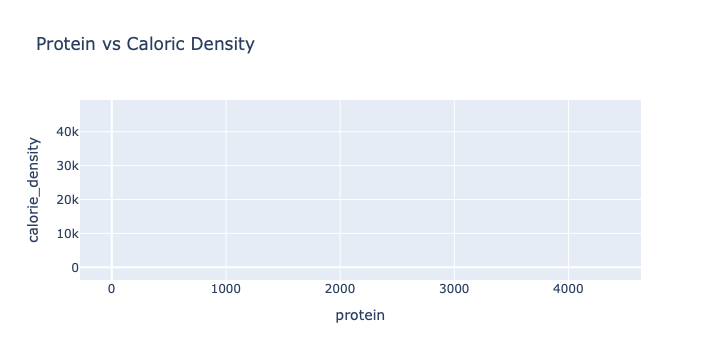

In [18]:
nutrition_cols = [
    "calories", "fat", "sugar", "sodium",
    "protein", "saturated_fat", "carbohydrates"
]

recipes["nutrition_list"] = recipes["nutrition"].apply(eval)

for i, col in enumerate(nutrition_cols):
    recipes[col] = recipes["nutrition_list"].apply(lambda x: x[i])

recipes = recipes.drop(columns=["nutrition_list"])

recipes['calorie_density'] = recipes['calories']

fig = px.scatter(
    recipes, 
    x = 'protein',
    y = 'calorie_density',
    opacity = 0.4,
    title = 'Protein vs Caloric Density'
)

fig.show()


### Identifying Outliers
Because there are a few very distinct outliers, I first wanted to identify which recipes they were and how extreme they are. A small number of recipes contain very high calorie counts (30,000+ calories per serving), which compress the scale of the plots and make it difficult to see the rest of the data.

In [5]:
recipes[recipes['calories'] > 30000] [['name', 'calories', 'nutrition']]

,name,calories,nutrition
49648,moonshine easy,36188.8,"[36188.8, 106.0, 30260.0, 80.0, 329.0, 48.0, 3..."
59262,powdered hot cocoa mix,45609.0,"[45609.0, 3379.0, 16901.0, 1478.0, 4356.0, 687..."


Before exploring distribution, I examined extreme values in the `calories` and `protein` columns. A small number of recipes contained extreme high calorie counts (30,000 + calories per serving), which compress the scale of the plots and make it difficult to visualize the rest of the data. These outliers are valied entries, but for the sake of interpretable visualizations, I filtered them out **only for EDA plots**. The full dataset is still preserved for hypothesis testing and modeling. 

In [6]:
eda = recipes[(recipes['calories'] < 30000) & (recipes['protein'] < 250)]

In [7]:
eda['protein'].plot.hist(bins = 50, title = 'Distribution of Protein per Serving')

### Distribution of Protein per Serving

The distribution of protein is highly right-skewed. Most recipes contain between 0–30 grams of protein, while a long tail extends toward much higher values. This means that very high-protein recipes exist but are rare, and the majority of meals in the dataset are relatively moderate in protein.

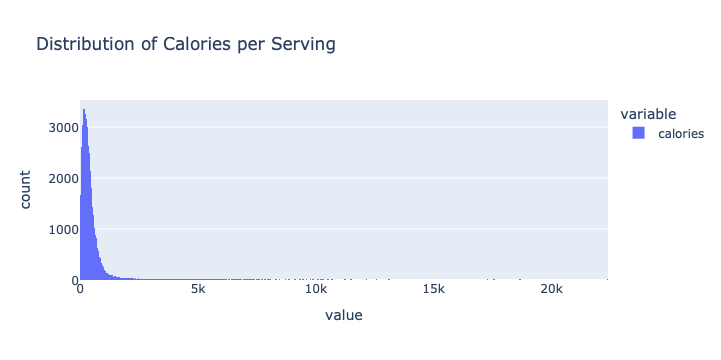

In [8]:
eda['calories'].plot.hist(bins = 50, title = 'Distribution of Calories per Serving')

### Distribution of Calories per Serving

Calories per serving are also right-skewed. Most recipes fall well under 1000 calories, but a small number extend into very high calorie ranges, which is why the filtered EDA view is helpful. These extreme values represent unusually dense or concentrated recipes and would otherwise dominate the scale of the histogram.


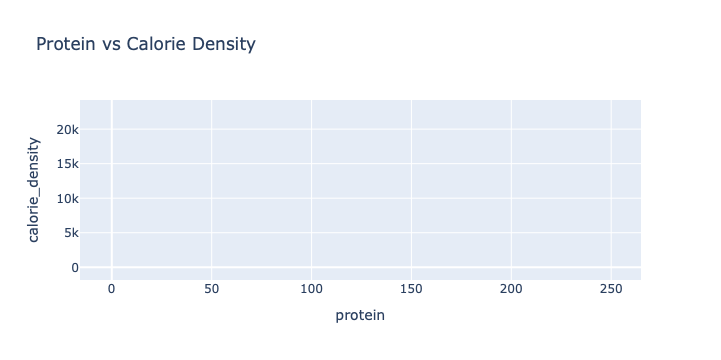

In [9]:
fig = px.scatter(
    eda, 
    x = 'protein',
    y = 'calorie_density',
    opacity = 0.4,
    title = 'Protein vs Calorie Density'
)

fig.show()

### Relationship Between Protein and Calorie Density 
The scatterplot shows substantial variation in calorie density at each protein level, with no immediate visual indication of a strong linear relationship. Most points cluster in the low-protein, moderate-calorie range, while higher-protein recipes display a wider spread in calorie density. This uncertainty makes it unclear whether high-protein recipes are systematically more or less calorie-dense, which motivates the hypothesis testing in Step 4.

# Assessment of Missingness

### Missingness Analysis 
The only meaningful missing values in the datset occur in the `description` column. To analyze whether this missingness is random, I compared the number of ingredients between recipes with and without a desription. 

In [10]:
recipes.isna().sum()

name                1
id                  0
minutes             0
contributor_id      0
submitted           0
tags                0
nutrition           0
n_steps             0
steps               0
description        70
ingredients         0
n_ingredients       0
calories            0
fat                 0
sugar               0
sodium              0
protein             0
saturated_fat       0
carbohydrates       0
calorie_density     0
dtype: int64

In [11]:
recipes['protein'].isna().mean()

np.float64(0.0)

In [12]:
recipes['description'].isna().sum()

np.int64(70)

In [14]:
missing = recipes[recipes['description'].isna()]['n_ingredients']
not_missing = recipes[~recipes['description'].isna()]['n_ingredients']

obs = not_missing.mean() - missing.mean()
obs

np.float64(1.4723927615771073)

The observed difference in average ingredient count between the two groups is show above. Recipes without a description tend to use fewer ingredients. 

In [15]:
diffs = []
for _ in range(1000):
    shuffled = recipes['description'].isna().sample(frac = 1, replace = False).reset_index(drop = True)
    m = recipes.assign(shuffled = shuffled)
    diffs.append(
        m[~m["shuffled"]]['n_ingredients'].mean() - 
        m[m['shuffled']]['n_ingredients'].mean()
    )

p_value = (np.array(diffs) >= obs).mean()
p_value


np.float64(0.0)

In [16]:
recipes.columns

Index(['name', 'id', 'minutes', 'contributor_id', 'submitted', 'tags',
       'nutrition', 'n_steps', 'steps', 'description', 'ingredients',
       'n_ingredients', 'calories', 'fat', 'sugar', 'sodium', 'protein',
       'saturated_fat', 'carbohydrates', 'calorie_density'],
      dtype='object')

The permutation test resulted in a p-value of 0, indicating that the observed difference is extremely unlikely to occur due to randome chance. 

## Step 4: Hypothesis Testing
(fill with description)

**Null Hypothesis:** High protein have the same average calories per serving

**Alternative Hypothesis:** High protein recipes have lower average calories per serving compared to low protein recipes. 

- understand these through the difference in mean calories per servies (i.e. high_protein vs low_protein)


In [16]:
recipes['nutrition_list'] = recipes['nutrition'].apply(eval)

nutrition_cols = [ 
    'calories', 'fat', 'sugar', 'sodium', 
    'protein', 'saturated_fat', 'carbohydrates'
]

for i, col in enumerate(nutrition_cols):
    recipes[col] = recipes['nutrition_list'].apply(lambda x: x[i])

recipes = recipes.drop(columns = ['nutrition_list'])

recipes[['name', 'protein', 'calories']].head()

,name,protein,calories
0,1 brownies in the world best ever,3.0,138.4
1,1 in canada chocolate chip cookies,13.0,595.1
2,412 broccoli casserole,22.0,194.8
3,millionaire pound cake,20.0,878.3
4,2000 meatloaf,29.0,267.0


In [17]:
q1 = recipes['protein'].quantile(0.25)
q3 = recipes['protein'].quantile(0.75)

def protein_group(p):
    if p >= q3:
        return 'high'
    elif p <= q1:
        return 'low'
    else:
        return 'mid'

recipes['protein_group'] = recipes['protein'].apply(protein_group)
recipes['protein_group'].value_counts()

protein_group
mid     41511
high    21276
low     20995
Name: count, dtype: int64

In [18]:
high = recipes[recipes['protein_group'] == 'high']['calories']
low = recipes[recipes['protein_group'] == 'low']['calories']

obs_stat = low.mean() - high.mean()
obs_stat

np.float64(-643.4002637014489)

In [19]:
perm_stats = []
for _ in range(1000):
    shuffled = recipes['protein_group'].sample(frac = 1, replace = False).reset_index(drop = True)
    df = recipes.assign(pg = shuffled)

    high = df[df['pg'] == 'high']['calories'].mean()
    low = df[df['pg'] == 'low']['calories'].mean()
    perm_stats.append(low - high)

p_value = (np.array(perm_stats) >= obs_stat).mean()
p_value

np.float64(1.0)

In [20]:
fig = recipes[recipes['protein_group'].isin(['high','low'])].plot.scatter(
    x = 'protein',
    y = 'calories',
    title = 'Protein vs Calories per Serving',
    opacity = 0.5
)

fig


## Step 5: Framing a Prediction Problem

In [21]:
baseline_rmse, lr_rmse, lr_r2

NameError: name 'baseline_rmse' is not defined

## Step 6: Baseline Model

In [ ]:
# TODO

## Step 7: Final Model

In [ ]:
# TODO

## Step 8: Fairness Analysis

In [ ]:
# TODO